In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
import os
import numpy as np
import cv2
from skimage.feature import hog
import pandas as pd
from google.colab.patches import cv2_imshow
from PIL import Image, ImageChops

In [ ]:
link_X_train = '/content/drive/MyDrive/HOG/xtrain_HOG.csv'
link_Y_train = '/content/drive/MyDrive/HOG/ytrain_HOG.csv'
X_train = pd.read_csv(link_X_train,header=None).to_numpy()
Y_train = pd.read_csv(link_Y_train,header=None).to_numpy()

In [ ]:
import joblib
SVM = joblib.load('/content/drive/MyDrive/SVM.sav')

In [ ]:
def Predict(img):
  feature = []
  img_hog = hog(img, pixels_per_cell=(2,2), cells_per_block=(2,2), visualize=False)
  x = np.asarray(img_hog).ravel()
  feature.append(x)
  feature = np.array(feature)
  predict = SVM.predict(feature)
  result = predict[0]
  return result

In [ ]:
def CropImage(image):
  #Phân ngưỡng ảnh thành ảnh có 2 loại điểm ảnh 0 và 255
  threshold, img = cv2.threshold(image, 125, maxval = 255, type = cv2.THRESH_BINARY)
  cv2_imshow(img)
  #Xử lý nhiễu với bộ lọc Median
  img = cv2.medianBlur(img, 5)
  cv2_imshow(img)
  #Cắt ảnh vào sát chữ
  maxUp = img.shape[0]//2
  maxDown = img.shape[0]//2
  maxRight = img.shape[1]//2
  maxLeft = img.shape[1]//2

  for i in range(img.shape[0]):
    for j in range(img.shape[1]):
      if img[i][j] < 100:
        if maxUp >= i: maxUp = i
        if maxDown <= i: maxDown = i
        if maxRight <= j: maxRight = j
        if maxLeft >= j: maxLeft = j
        
  #cắt ảnh
  cropImage = img[maxUp:maxDown + 1, maxLeft:maxRight + 1]
  cv2_imshow(cropImage)
  #resize ảnh về kích thước 16x20
  cropImage = cv2.resize(cropImage,(16, 20), interpolation=cv2.INTER_AREA)
  cv2_imshow(cropImage) 
  return cropImage

In [ ]:
labels = ['a', 'à', 'á', 'â', 'ầ', 'ấ', 'ẫ', 'ẩ', 'ã', 'ă', 'ằ', 'ắ', 'ẵ', 'ẳ', 'ả', 'ạ', 'ậ', 'ặ', 'b', 'c', 'd', 'e', 'è', 'é', 'ê', 'ề', 'ế', 'ễ', 'ể', 'ẽ', 'ẻ', 'ẹ', 'ệ', 'g', 'h', 'i', 'ì', 'í', 'ĩ', 'ỉ', 'ị', 'k', 'l', 'm', 'n', 'o', 'ò', 'ó', 'ô', 'ồ', 'ố', 'ỗ', 'ổ', 'õ', 'ỏ', 'ơ', 'ờ', 'ớ', 'ỡ', 'ở', 'ợ', 'ọ', 'ộ', 'p', 'q', 'r', 's', 't', 'u', 'ù', 'ú', 'ũ', 'ủ', 'ư', 'ừ', 'ứ', 'ữ', 'ử', 'ự', 'ụ', 'v', 'x', 'y', 'ỳ', 'ý', 'ỹ', 'ỷ', 'ỵ', 'đ']

In [ ]:
def XulyData(path_to_files):
  for file_name in sorted(os.listdir(path_to_files)):
    file_path = os.path.join(path_to_files,file_name)
    img = cv2.imread(file_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    cv2_imshow(img)
    img_test = CropImage(img)
    cv2_imshow(img_test)
    os.chdir('/content/drive/MyDrive/test/demo')
    cv2.imwrite(file_name, img_test) 

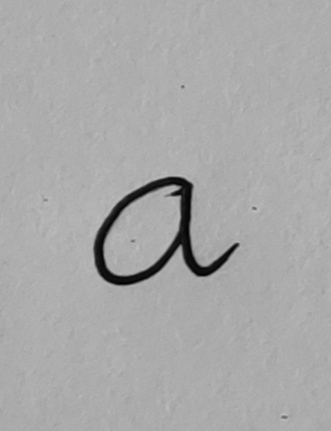

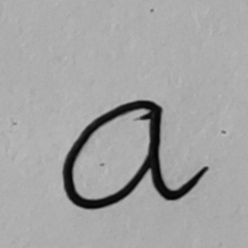

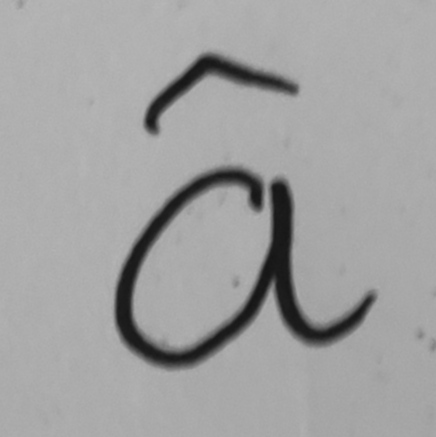

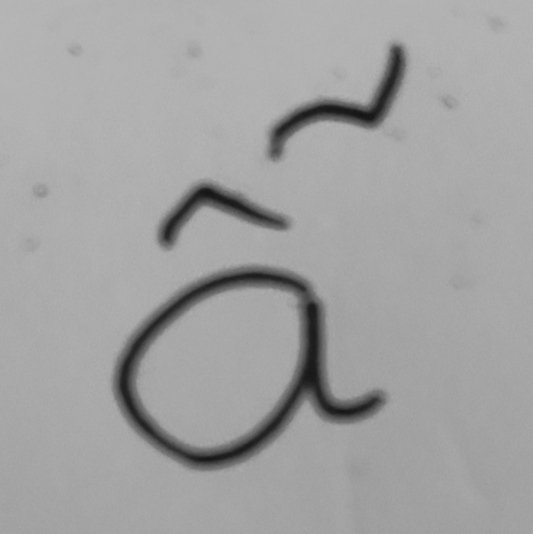

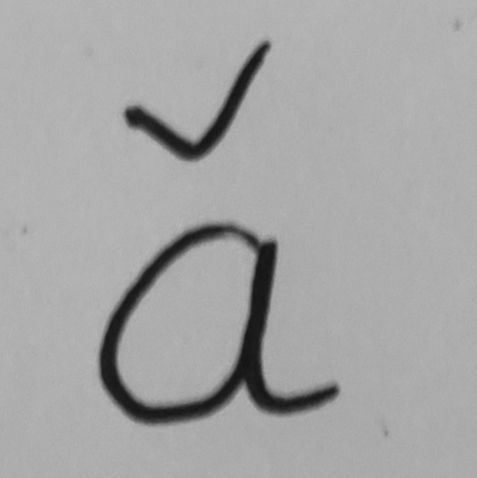

...

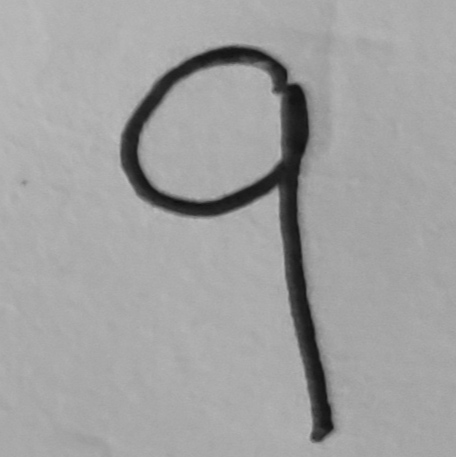

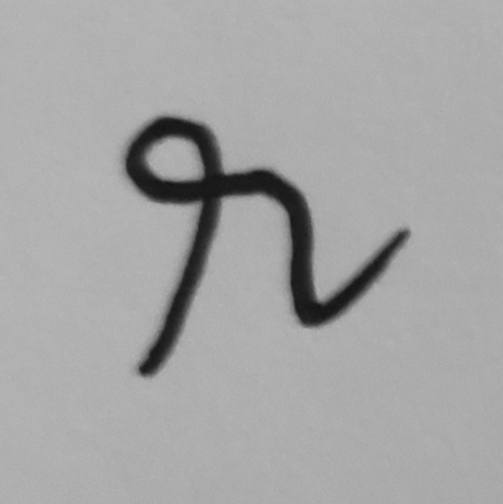

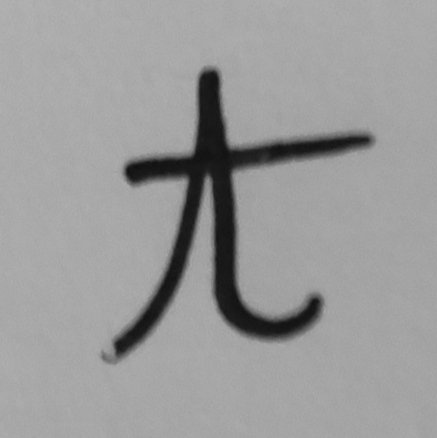

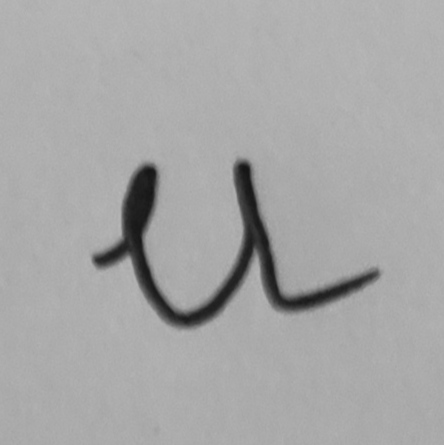

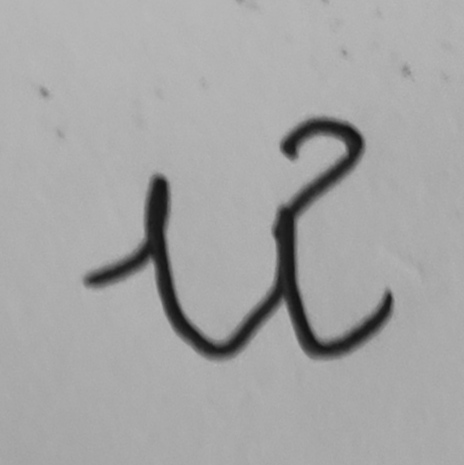

In [ ]:
XulyData('/content/drive/MyDrive/test/DataDemo')

In [ ]:
def Demo(path_to_files):
  for file_name in sorted(os.listdir(path_to_files)):
    file_path = os.path.join(path_to_files,file_name)
    im = cv2.imread(file_path)
    cv2_imshow(im)
    img = Image.open(file_path).convert('LA')
    predict_img = Predict(img)
    print(labels[predict_img])

In [ ]:
Demo('/content/drive/MyDrive/test/demo')

u


ư


ế


ỏ


ô


ã


đ


ê


e


õ


õ


a


a


ằ


b


c


d


ể


h


k


o


ô


ỏ


ỡ


p


q


r


t


In [ ]:
def Demo1chu(file_path):
    image = cv2.imread(file_path)
    cv2_imshow(image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = CropImage(image)
    os.chdir('/content/drive/MyDrive/test/demo')
    cv2.imwrite('demo.jpg', image) 
    img = Image.open('/content/drive/MyDrive/test/demo/demo.jpg').convert('LA')
    predict_img = Predict(img)
    print(labels[predict_img])

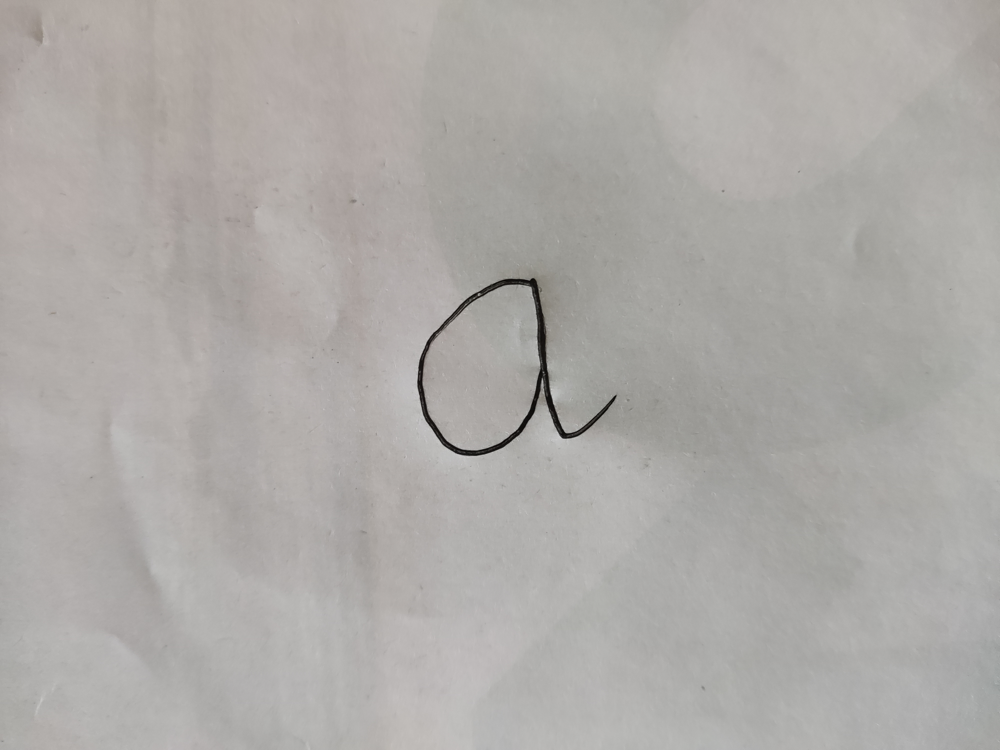

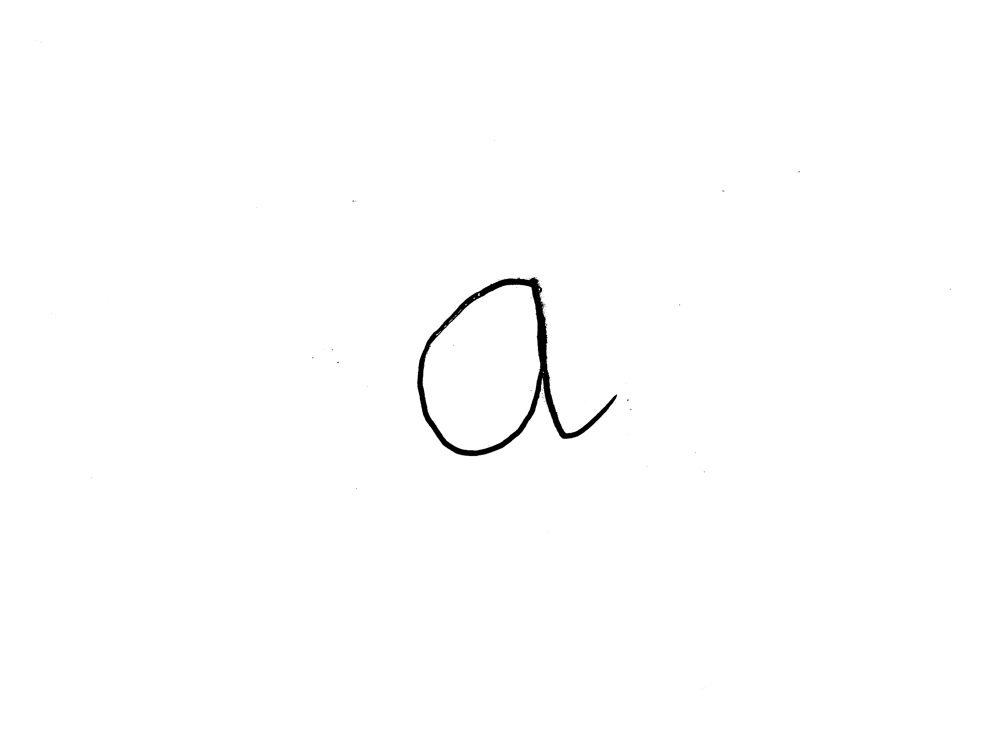

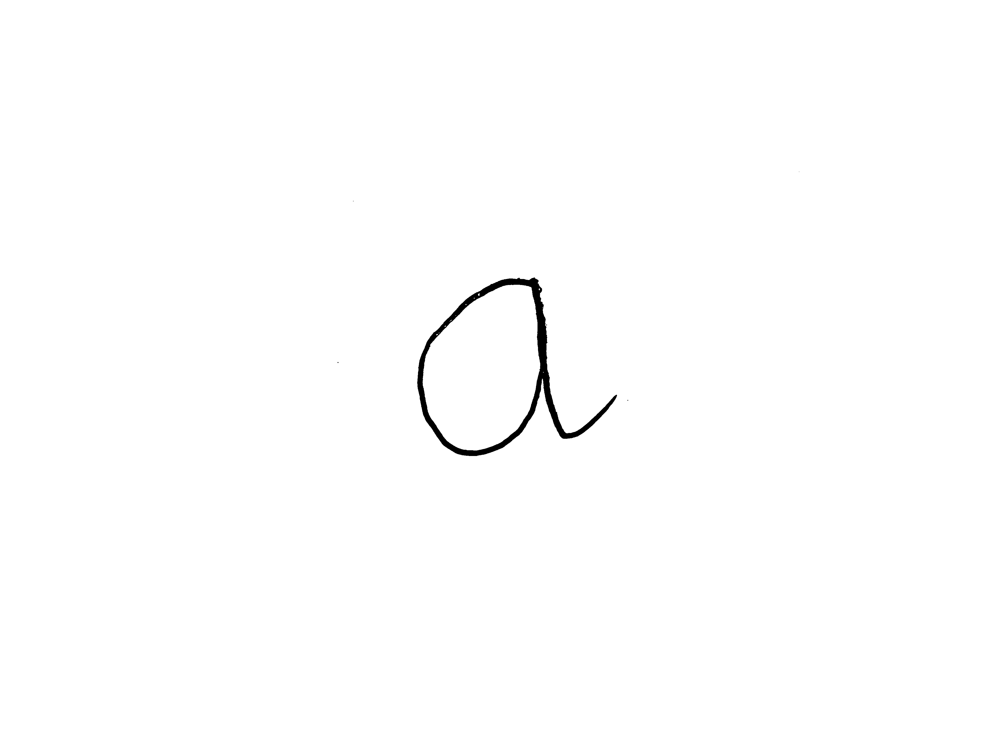

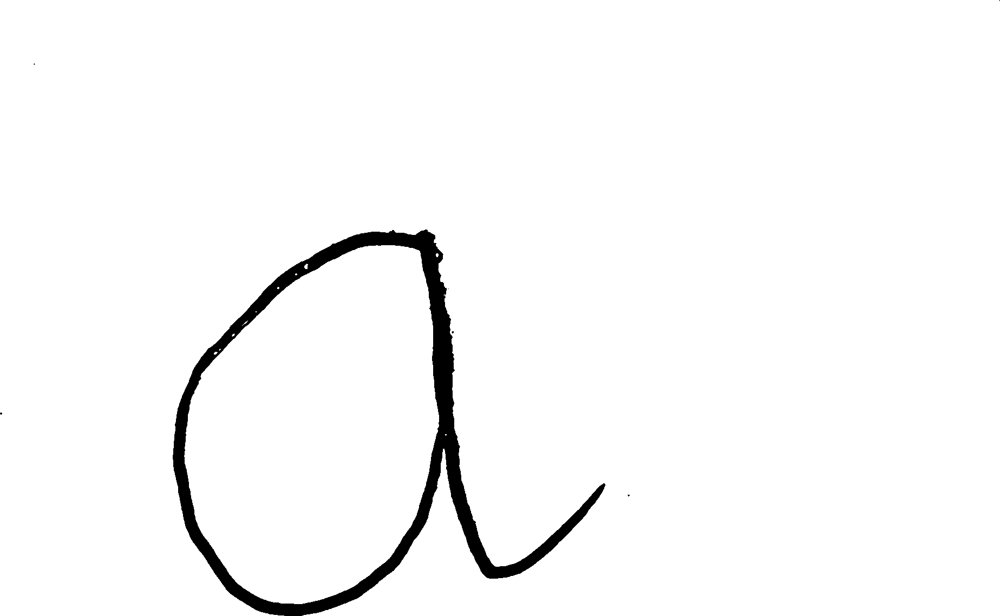

ì


In [ ]:
Demo1chu('/content/drive/MyDrive/test/DataDemo/1642756345920.jpg')